In [2]:
from PIL import Image
from shutil import copy

import numpy as np
import os
from io import BytesIO
from keras.preprocessing.image import img_to_array
from PIL import ImageOps

Image.MAX_IMAGE_PIXELS = None

In [3]:
os.chdir('..')

In [4]:
input_dir = os.path.join(os.getcwd(), 'images5')

In [13]:
train_dir = r'C:\Users\Leonardo\forestfire\images5\train'
val_dir = r'C:\Users\Leonardo\forestfire\images5\val'
test_dir = r'C:\Users\Leonardo\forestfire\images5\test'

In [6]:
os.getcwd()

'C:\\Users\\Leonardo\\forestfire'

In [7]:
def light_dark_selector(directory, dark_threshold, light_threshold):
    # Selects a list of images based on desired maximum light_threshold and minimum dark_threshold
    # We will use this to extract night images from datasets and keep only the day images
    count = 0
    list_of_selected =[]
    min_intensity = 0
    file_min_intensity = ""
    max_intensity = 0
    file_max_intensity = ""

    for i in sorted(os.listdir(directory)):
        if 'original' in str(i):
            number = i.split('.')[0].split('_')[0]
            correspondent_mask = "%s_mask.png" %number
            img = Image.open(os.path.join(directory,i))
            mean_intensity = img_to_array(img).mean()
            
            if ((mean_intensity > dark_threshold) and (mean_intensity < light_threshold)):
                list_of_selected.append(i)
                list_of_selected.append(correspondent_mask)
                
                if mean_intensity >= max_intensity:
                    max_intensity = mean_intensity
                    file_max_intensity = i
                else:
                    min_intensity = mean_intensity
                    file_min_intensity = i
            else:
                pass
            
        if count % 1000 == 0:
            print(count)
        
        count += 1    
        
    print('minimal intensity was reached by %s file with %s of intensity' %(file_min_intensity, min_intensity))
    print('maximal intensity was reached by %s file with %s of intensity' %(file_max_intensity, max_intensity))
    
    return list_of_selected

In [8]:
def patch_maker(file, patch_size=384):
    #Function receives a file and creates the patches of 384 x 384 as a list of images
    patches = []
    size_0 = 1920
    size_1 = 1152
    x_pos = 0
    y_pos = 0
    img = Image.open(file)
    #Applies a 8 pixels border on top to have exactly 510 patches of size 64 x 64 on the 1920 x 1088 images
    temp = Image.new(img.mode, (img.size[0], (img.size[1] + 72)), color=0)
    temp.paste(img, (0, 36))
    
    for i in range(int(size_0 / patch_size) * int(size_1 / patch_size)):
        if x_pos == size_0:
            x_pos = 0
            y_pos += patch_size

        patches.append(temp.crop(box=(x_pos, y_pos, x_pos + patch_size, y_pos + patch_size)).copy())

        x_pos += patch_size
            
    return patches

In [9]:
def patch_unmaker(patches, patch_size=384):
    #Function receives a list of patches of size 384 x 384 and creates an 1920 x 1080 image again
    size_0 = 1920
    size_1 = 1152
    img = Image.new('RGB', (size_0, size_1), color=0)
    x_pos = 0
    y_pos = 0
    
    for i in range(len(patches)):
        if x_pos == size_0:
            x_pos = 0
            y_pos += patch_size
            img.paste(patches[i], (x_pos, y_pos))
            x_pos += patch_size
        else:
            img.paste(patches[i], (x_pos, y_pos))
            x_pos += patch_size

    
    img = img.crop(box=(0,36, size_0, (size_1 - 36)))
    
    return img

In [52]:
#Selecting just day images for training dataset
sel_train_images = light_dark_selector(train_dir, 90,160)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
minimal intensity was reached by 9_original.png file with 125.295586 of intensity
maximal intensity was reached by 4196_original.png file with 151.82596 of intensity


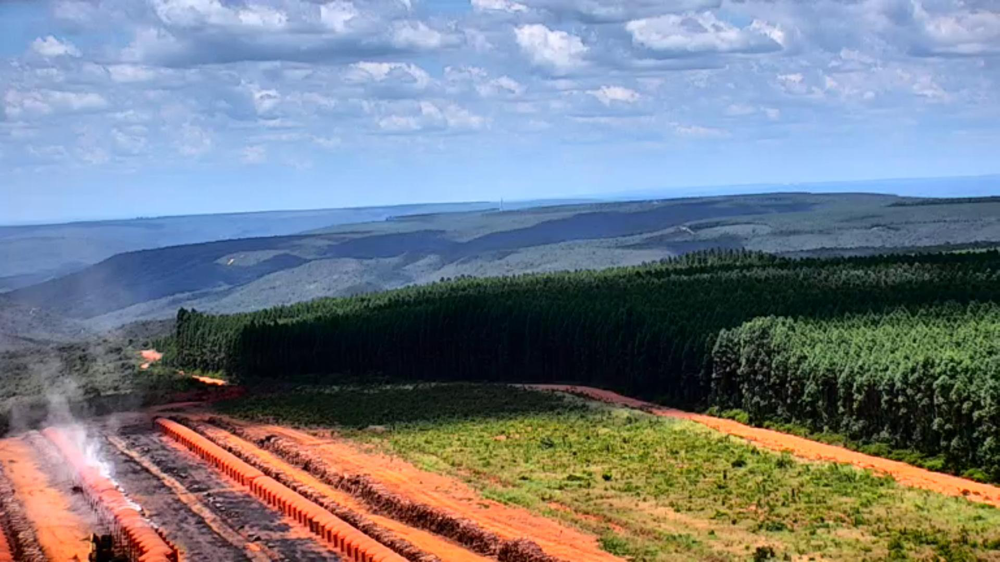

In [53]:
Image.open(os.path.join(train_dir, '9_original.png'))

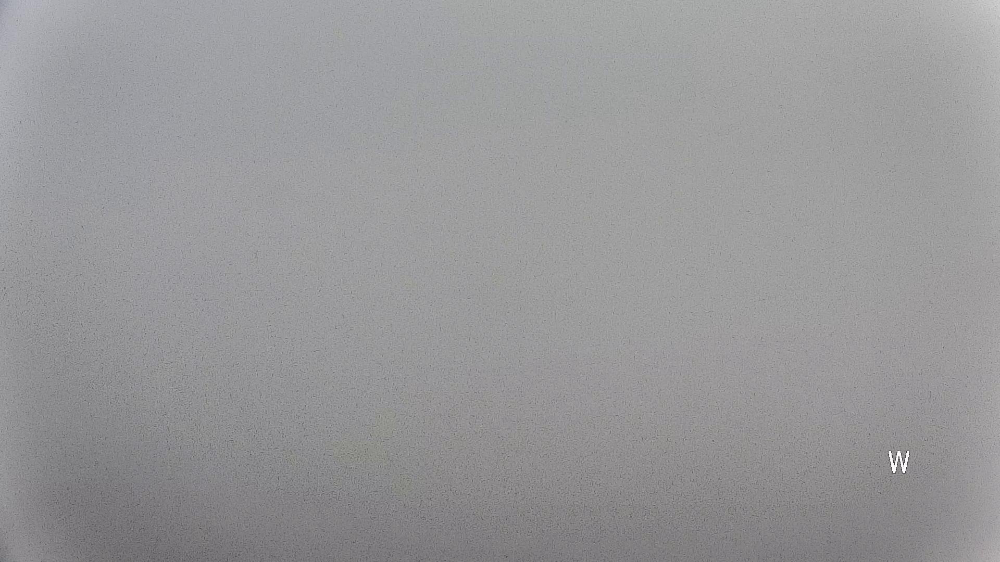

In [54]:
Image.open(os.path.join(train_dir, '4196_original.png'))

In [55]:
#Selecting just day images for validation dataset
sel_val_images = light_dark_selector(val_dir, 90,160)

0
1000
2000
3000
minimal intensity was reached by 9_original.png file with 130.73358 of intensity
maximal intensity was reached by 152_original.png file with 149.48975 of intensity


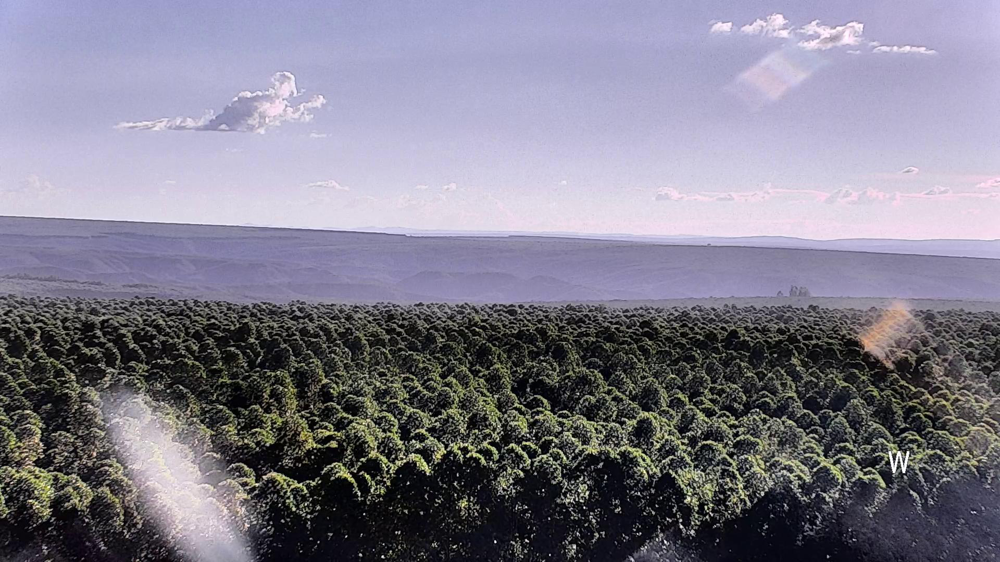

In [56]:
Image.open(os.path.join(val_dir, '9_original.png'))

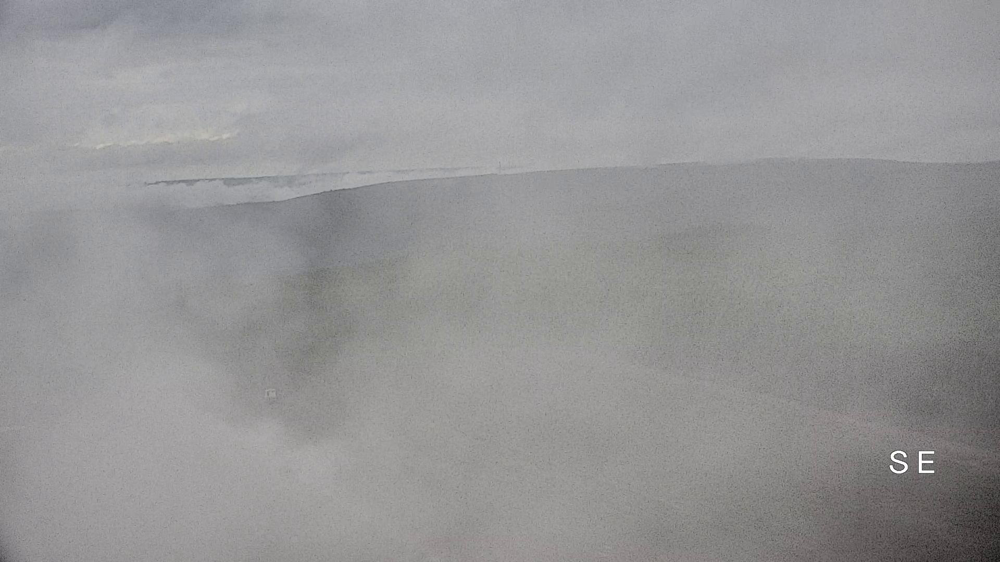

In [57]:
Image.open(os.path.join(val_dir, '152_original.png'))

In [58]:
len(sel_train_images)/2

4440.0

In [59]:
len(sel_val_images)/2

1501.0

In [60]:
def patch_and_augment(directory, selected_images, patch_size=384, augmenting_threshold=0.01):
    # Takes a list of images and creates all the 384 x 384 patches for them. Also separate them in new subdirectories
    # for training NNs
    
    count = 0
    for i in sorted(selected_images):
        if i == 'new':
            pass
        
        else:        
            if 'mask' in str(i):
                number = i.split('.')[0].split('_')[0]
                mask_name = i.split('.')[0]
                img_name = "%s_original" %number
                correspondent_image = "%s_original.png" %number
                mask_patches = patch_maker(os.path.join(directory,i), patch_size=384)
                image_patches = patch_maker(os.path.join(directory, correspondent_image), patch_size=384)

                for j in range(len(mask_patches)):
                    msk = mask_patches[j]
                    img = image_patches[j]

                    sum_up_mask = np.sum(img_to_array(msk, dtype='float16') / 255)

                    if sum_up_mask > (augmenting_threshold * msk.size[0] * msk.size[1]):

                        #Mirroring and saving both images

                        img2 = img
                        newfileimgname = "%s_%s_%s.png" %(img_name, j, 1)
                        img2.save(os.path.join(directory, 'images/new', newfileimgname))

                        img2 = ImageOps.mirror(img)
                        newfileimgname = "%s_%s_%s.png" %(img_name, j, 2)
                        img2.save(os.path.join(directory, 'images/new', newfileimgname))

                        #Saving both masks
                        msk2 = msk
                        newfilemskname = "%s_%s_%s.png" %(mask_name, j, 1)
                        msk2.save(os.path.join(directory,'masks/new', newfilemskname))

                        msk2 = ImageOps.mirror(msk)
                        newfilemskname = "%s_%s_%s.png" %(mask_name, j, 2)
                        msk2.save(os.path.join(directory,'masks/new', newfilemskname))

                    else:
                        # Don´t mirror anything, just save
                        img2 = img
                        newfileimgname = "%s_%s_%s.png" %(img_name, j, 1)
                        img2.save(os.path.join(directory, 'images/new', newfileimgname))

                        #Saving mask
                        msk2 = msk
                        newfilemskname = "%s_%s_%s.png" %(mask_name, j, 1)
                        msk2.save(os.path.join(directory,'masks/new', newfilemskname))


                if count % 200 == 0:
                    print(count)

                count += 1

In [61]:
#Creating the directories to store the final images and masks for train and validation datasets to be used on model
os.mkdir(os.path.join(input_dir, 'train/images'))
os.mkdir(os.path.join(input_dir, 'train/masks'))
os.mkdir(os.path.join(input_dir, 'val/images'))
os.mkdir(os.path.join(input_dir, 'val/masks'))

In [62]:
os.mkdir(os.path.join(input_dir, 'train/images/new'))
os.mkdir(os.path.join(input_dir, 'train/masks/new'))
os.mkdir(os.path.join(input_dir, 'val/images/new'))
os.mkdir(os.path.join(input_dir, 'val/masks/new'))

In [63]:
# Applying both the patch and the augmentation for smoke patches for training dataset
patch_and_augment(train_dir, sel_train_images)

0


C:\Users\Leonardo\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600
3800
4000
4200
4400


In [64]:
# Applying both the patch and the augmentation for smoke patches for validation dataset
patch_and_augment(val_dir, sel_val_images)

0
200
400
600
800
1000
1200
1400
